# Detekcja narożników szachownicy OpenCV

Notatnik wykrywa 81 wewnętrznych narożników szachownicy 10 × 10 pól (wzór OpenCV: 9 × 9). Długość boku pola wynosi 30 mm. Dla każdego zdjęcia wynik detekcji jest pokazany poniżej, a poprawne detekcje są zapisywane w osobnych plikach YAML.

Wzór narożników OpenCV: 9 x 9
Rozmiar pola: 30.0 mm
Katalog wynikowy: /home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/characteristic_point
OpenCV: 4.13.0
Znaleziono zdjęć: 10 (oczekiwano 10)
01. capture_0183_correct.png
02. capture_0185_correct.png
03. capture_0187_correct.png
04. capture_0188_correct.png
05. capture_0191_correct.png
06. capture_0193_correct.png
07. capture_0196_correct.png
08. capture_0197_correct.png
09. capture_0200_correct.png
10. capture_0208_correct.png
Przetworzono: 10 zdjęć


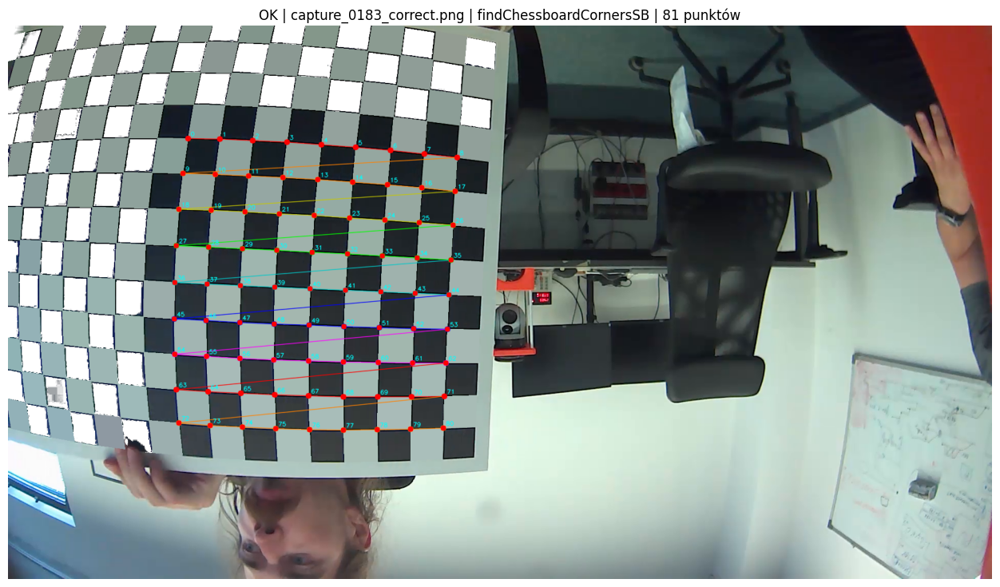

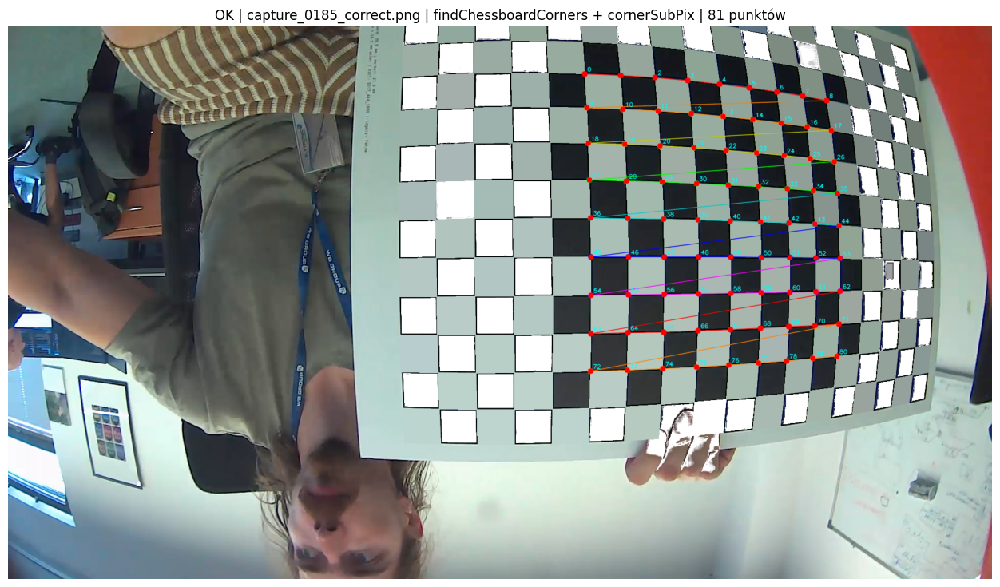

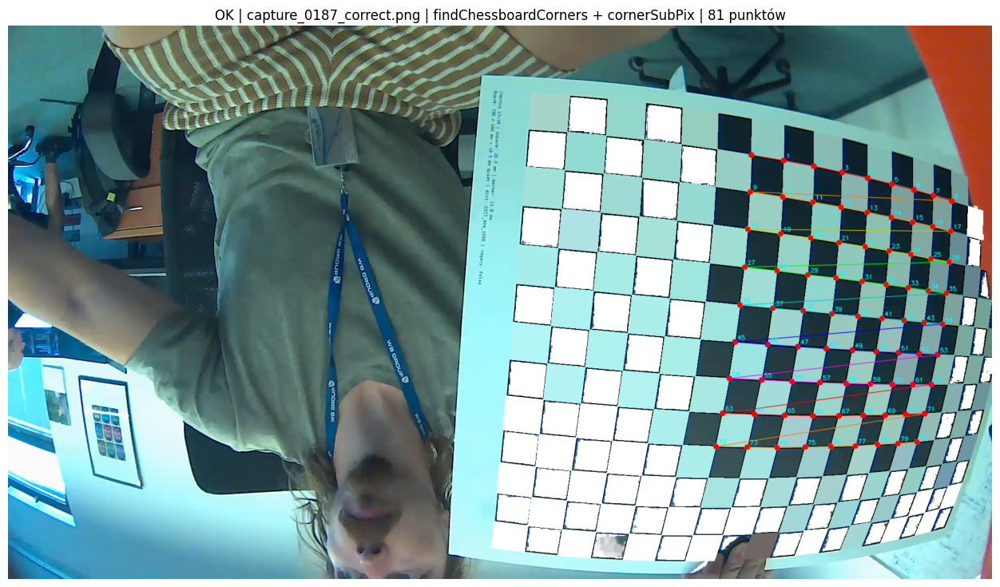

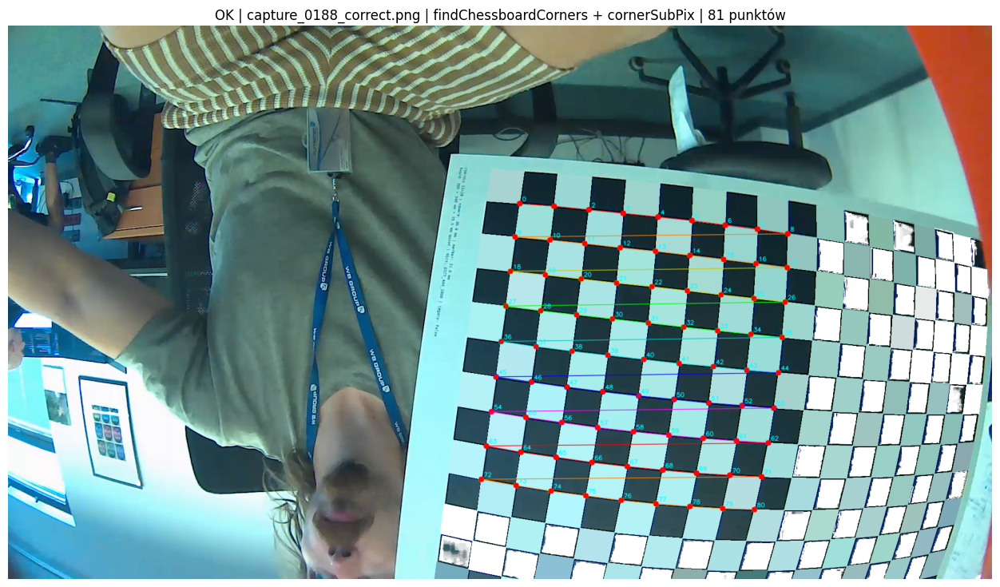

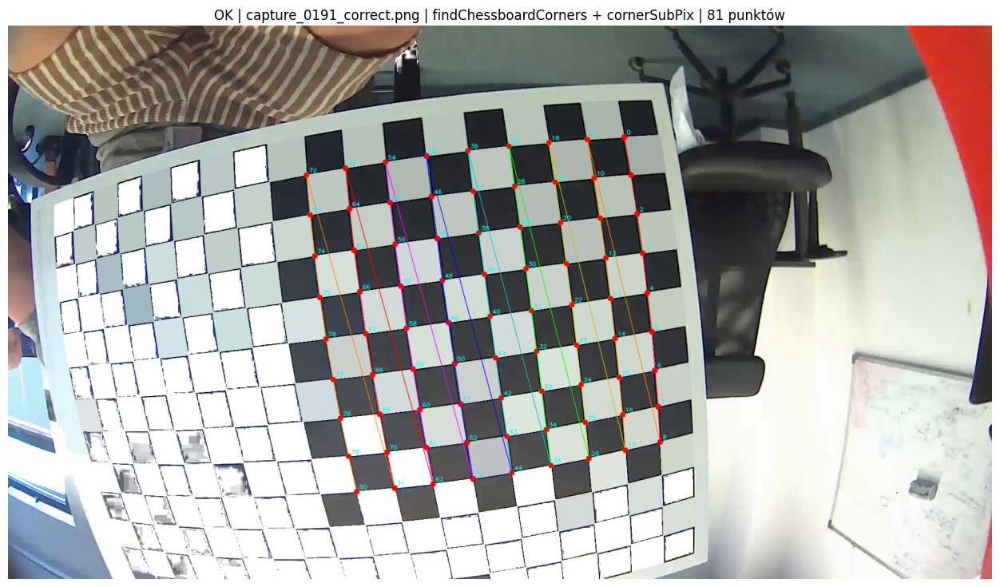

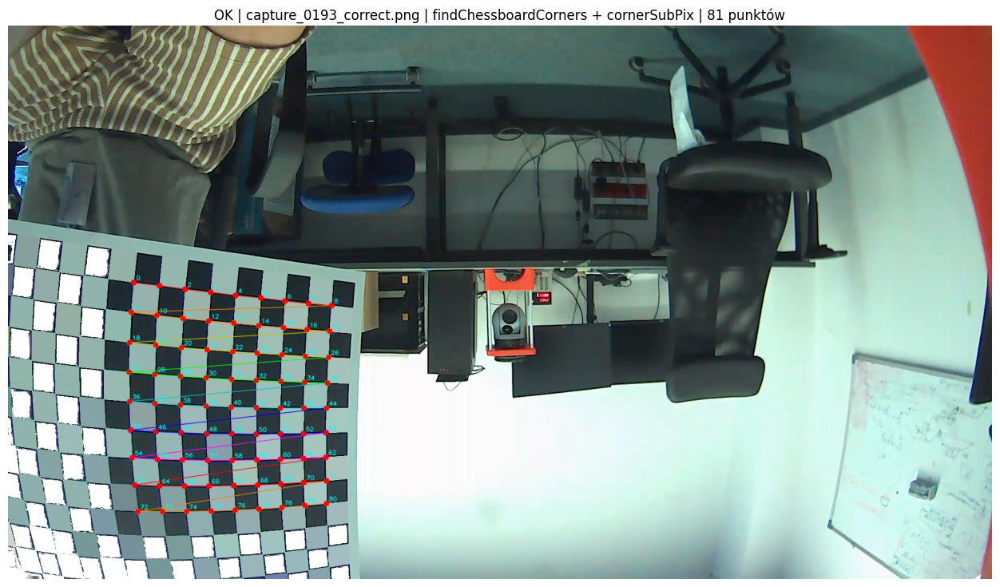

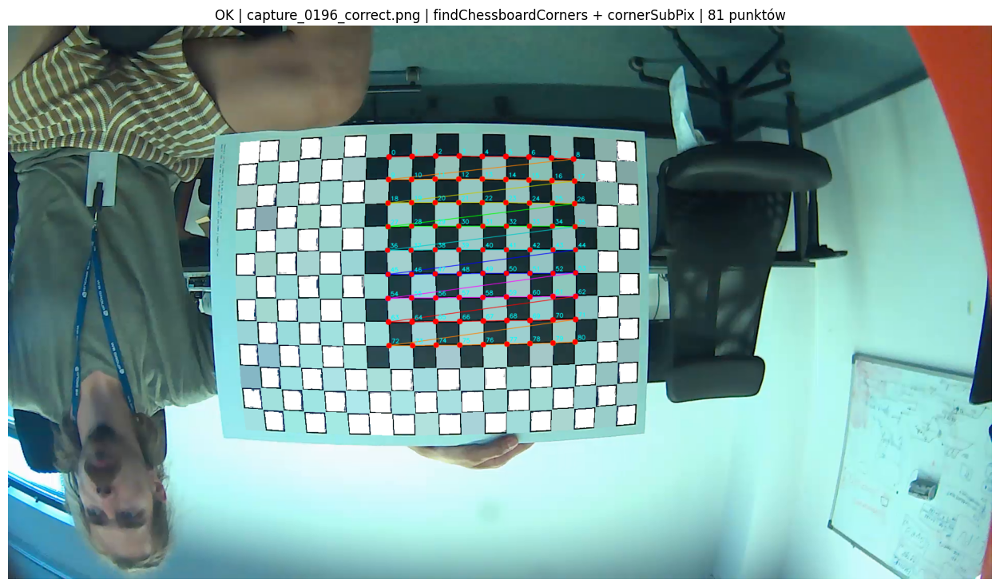

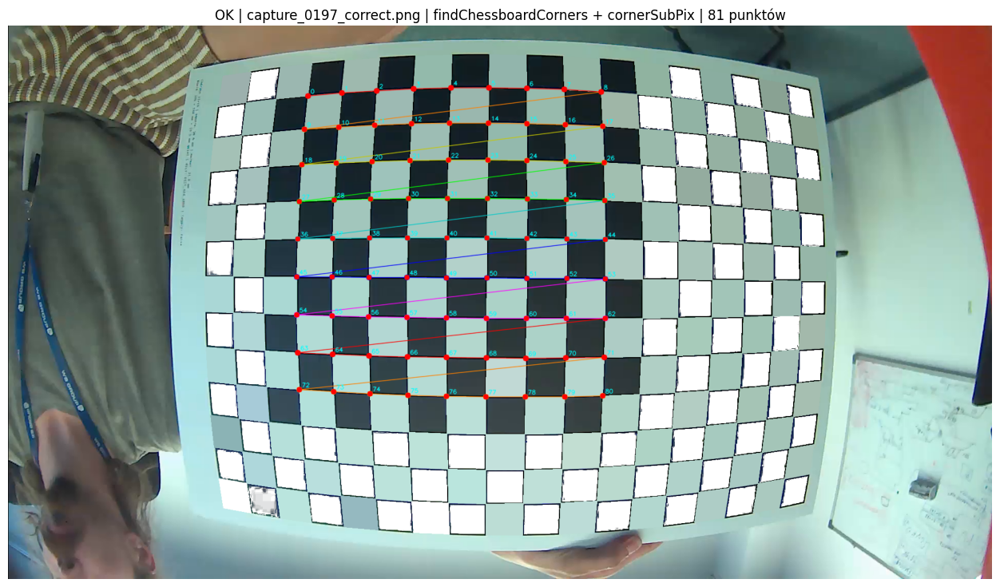

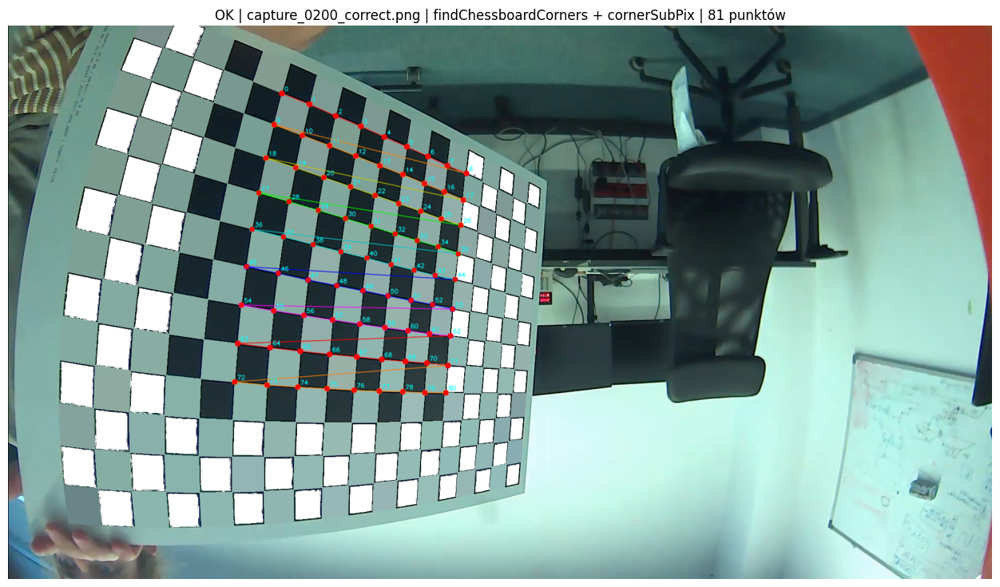

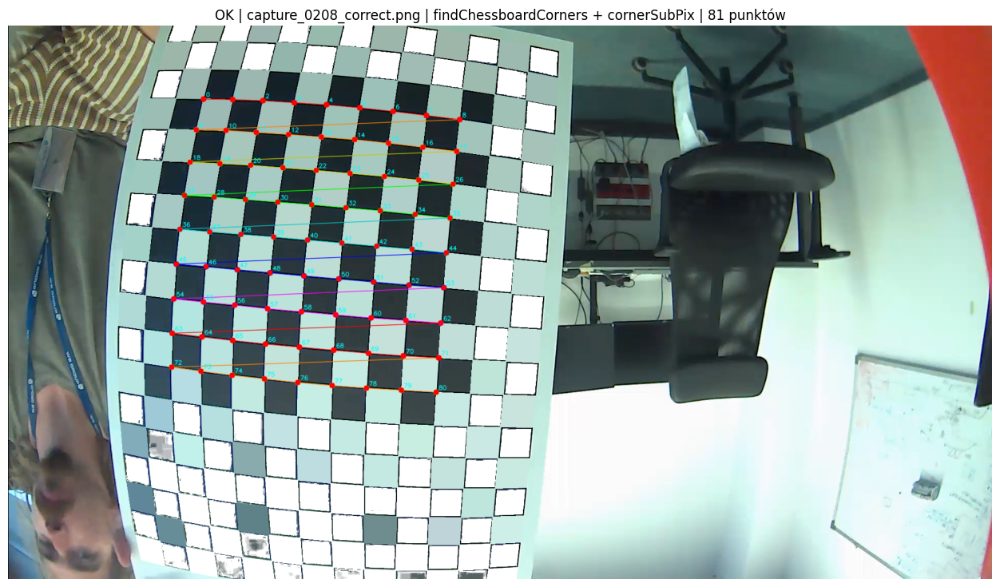

Zapisano 10 plików YAML w /home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/characteristic_point


,zdjęcie,status,liczba_punktów,plik_YAML,komunikat
0,capture_0183_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
1,capture_0185_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
2,capture_0187_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
3,capture_0188_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
4,capture_0191_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
5,capture_0193_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
6,capture_0196_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
7,capture_0197_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
8,capture_0200_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,
9,capture_0208_correct.png,OK,81,/home/dbabiarczyk/studia/semestr10/camera_cali...,



Walidacja końcowa:
- poprawne detekcje: 10/10
- nieudane detekcje: 0
- brakujące pliki YAML: 0
- poprawne wyniki z liczbą punktów inną niż 81: 0
Wszystkie poprawne detekcje mają 81 punktów i plik YAML.


In [6]:
from pathlib import Path

# Ścieżki można zmienić przed ponownym uruchomieniem notatnika. /home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/datasets_without_charuco_markers_white/capture_0183.png
DATASET_DIR = Path("/home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/dataset_correct_chessboard")
OUTPUT_DIR = Path("/home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/characteristic_point")

BOARD_SQUARES = (10, 10)
PATTERN_SIZE = (BOARD_SQUARES[0] - 1, BOARD_SQUARES[1] - 1)  # 9 x 9 narożników wewnętrznych
SQUARE_SIZE_MM = 30.0
EXPECTED_IMAGE_COUNT = 10
IMAGE_EXTENSIONS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
print(f"Wzór narożników OpenCV: {PATTERN_SIZE[0]} x {PATTERN_SIZE[1]}")
print(f"Rozmiar pola: {SQUARE_SIZE_MM:.1f} mm")
print(f"Katalog wynikowy: {OUTPUT_DIR}" )
import cv2
import numpy as np
import matplotlib.pyplot as plt
import yaml
from IPython.display import display

plt.rcParams["figure.figsize"] = (14, 8)
plt.rcParams["image.cmap"] = "gray"
print(f"OpenCV: {cv2.__version__}")

image_paths = sorted(
    path for path in DATASET_DIR.iterdir()
    if path.is_file() and path.suffix.lower() in IMAGE_EXTENSIONS
)

print(f"Znaleziono zdjęć: {len(image_paths)} (oczekiwano {EXPECTED_IMAGE_COUNT})")
if len(image_paths) != EXPECTED_IMAGE_COUNT:
    print("UWAGA: liczba zdjęć różni się od oczekiwanej; przetwarzanie będzie kontynuowane.")
for index, path in enumerate(image_paths, start=1):
    print(f"{index:02d}. {path.name}")
def make_object_points(pattern_size: tuple[int, int], square_size_mm: float) -> np.ndarray:
    """Zwraca punkty 3D w kolejności OpenCV, na płaszczyźnie Z=0."""
    points = np.zeros((pattern_size[0] * pattern_size[1], 3), dtype=np.float32)
    points[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2)
    points *= square_size_mm
    return points


def detect_corners(gray: np.ndarray) -> tuple[bool, np.ndarray | None, str]:
    """Najpierw używa findChessboardCornersSB, następnie klasycznego API OpenCV."""
    sb_flags = 0
    for flag_name in ("CALIB_CB_EXHAUSTIVE", "CALIB_CB_ACCURACY"):
        sb_flags |= getattr(cv2, flag_name, 0)

    if hasattr(cv2, "findChessboardCornersSB"):
        found, corners = cv2.findChessboardCornersSB(gray, PATTERN_SIZE, flags=sb_flags)
        if found and corners is not None:
            return True, corners.astype(np.float32), "findChessboardCornersSB"

    classic_flags = (
        getattr(cv2, "CALIB_CB_ADAPTIVE_THRESH", 0)
        | getattr(cv2, "CALIB_CB_NORMALIZE_IMAGE", 0)
        | getattr(cv2, "CALIB_CB_FAST_CHECK", 0)
    )
    found, corners = cv2.findChessboardCorners(gray, PATTERN_SIZE, flags=classic_flags)
    if not found or corners is None:
        return False, None, "Nie znaleziono wzoru"

    refined = cv2.cornerSubPix(
        gray,
        corners,
        winSize=(11, 11),
        zeroZone=(-1, -1),
        criteria=(cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001),
    )
    return True, refined.astype(np.float32), "findChessboardCorners + cornerSubPix"
def yaml_ready_points(points: np.ndarray) -> list[list[float]]:
    return [[float(x), float(y)] for x, y in points.reshape(-1, 2)]


def yaml_ready_object_points(points: np.ndarray) -> list[list[float]]:
    return [[float(x), float(y), float(z)] for x, y, z in points.reshape(-1, 3)]


object_points = make_object_points(PATTERN_SIZE, SQUARE_SIZE_MM)
results = []

for image_path in image_paths:
    image = cv2.imread(str(image_path), cv2.IMREAD_COLOR)
    error_message = ""
    corners = None
    detector = ""

    if image is None:
        error_message = "Nie można odczytać obrazu"
        gray = None
        found = False
        image_size = None
    else:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image_size = (int(gray.shape[1]), int(gray.shape[0]))
        try:
            found, corners, detector = detect_corners(gray)
            if not found:
                error_message = detector
        except cv2.error as exc:
            found = False
            error_message = f"Błąd OpenCV: {exc}"

    result = {
        "image_path": image_path,
        "image": image,
        "corners": corners,
        "found": bool(found),
        "detector": detector,
        "error": error_message,
        "image_size": image_size,
        "yaml_path": None,
    }
    results.append(result)

print(f"Przetworzono: {len(results)} zdjęć")
def draw_numbered_corners(image: np.ndarray, corners: np.ndarray) -> np.ndarray:
    """Rysuje punkty w kolejności OpenCV i numeruje je od 0 do 80."""
    overlay = image.copy()
    cv2.drawChessboardCorners(overlay, PATTERN_SIZE, corners, True)
    for index, point in enumerate(corners.reshape(-1, 2)):
        x, y = np.round(point).astype(int)
        cv2.circle(overlay, (x, y), 5, (0, 0, 255), -1)
        cv2.putText(
            overlay, str(index), (x + 5, y - 5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.38, (255, 255, 0), 1, cv2.LINE_AA,
        )
    return overlay


# Każdy obraz jest wyświetlany osobno, aby można było zweryfikować wszystkie 81 punktów.
for result in results:
    image = result["image"]
    if image is None:
        continue
    if result["found"]:
        display_image = draw_numbered_corners(image, result["corners"])
        title = f"OK | {result['image_path'].name} | {result['detector']} | 81 punktów"
    else:
        display_image = image.copy()
        title = f"NIEPOWODZENIE | {result['image_path'].name} | {result['error']}"

    plt.figure(figsize=(16, 9))
    plt.imshow(cv2.cvtColor(display_image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis("off")
    plt.show()
for result in results:
    if not result["found"]:
        continue

    image_path = result["image_path"]
    yaml_path = OUTPUT_DIR / f"{image_path.stem}.yaml"
    points = result["corners"].reshape(-1, 2)
    payload = {
        "image_name": image_path.name,
        "image_path": str(image_path),
        "image_width_px": result["image_size"][0],
        "image_height_px": result["image_size"][1],
        "board_squares": [BOARD_SQUARES[0], BOARD_SQUARES[1]],
        "inner_corners": [PATTERN_SIZE[0], PATTERN_SIZE[1]],
        "corner_count": int(len(points)),
        "square_size_mm": float(SQUARE_SIZE_MM),
        "detector": result["detector"],
        "image_points_px": yaml_ready_points(points),
        "object_points_mm": yaml_ready_object_points(object_points),
    }
    with yaml_path.open("w", encoding="utf-8") as file:
        yaml.safe_dump(payload, file, sort_keys=False, allow_unicode=True)
    result["yaml_path"] = yaml_path

print(f"Zapisano {sum(result['yaml_path'] is not None for result in results)} plików YAML w {OUTPUT_DIR}")
import pandas as pd

summary_rows = []
for result in results:
    point_count = int(result["corners"].shape[0]) if result["found"] else 0
    summary_rows.append({
        "zdjęcie": result["image_path"].name,
        "status": "OK" if result["found"] else "BŁĄD",
        "liczba_punktów": point_count,
        "plik_YAML": str(result["yaml_path"]) if result["yaml_path"] else "",
        "komunikat": result["error"],
    })

summary = pd.DataFrame(summary_rows)
display(summary)

invalid_point_counts = summary.loc[
    summary["status"].eq("OK") & summary["liczba_punktów"].ne(81)
]
missing_yaml = [
    result["image_path"].name for result in results
    if result["found"] and result["yaml_path"] is None
]
failed_images = summary.loc[summary["status"].eq("BŁĄD"), "zdjęcie"].tolist()

print("\nWalidacja końcowa:")
print(f"- poprawne detekcje: {int(summary['status'].eq('OK').sum())}/{len(summary)}")
print(f"- nieudane detekcje: {len(failed_images)}")
print(f"- brakujące pliki YAML: {len(missing_yaml)}")
print(f"- poprawne wyniki z liczbą punktów inną niż 81: {len(invalid_point_counts)}")
if failed_images:
    print("Nieudane zdjęcia:", ", ".join(failed_images))
if missing_yaml or not invalid_point_counts.empty:
    raise RuntimeError("Walidacja wyników nie powiodła się.")
print("Wszystkie poprawne detekcje mają 81 punktów i plik YAML.")

# kalibracja openCV



Użyto obrazów: 10
Rozmiar obrazu: 1920 × 1080 px
RMS zwrócony przez OpenCV fisheye: 0.423195 px
Globalny RMSE reprojekcji: 0.423195 px

Macierz kamery K:
[[1046.687552    0.        958.084649]
 [   0.       1047.872113  500.371096]
 [   0.          0.          1.      ]]

Współczynniki dystorsji fisheye [k1, k2, k3, k4]:
[-0.062846  0.00334  -0.013345  0.004726]

Wynik zapisano w: /home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/characteristic_point/camera_calibration_fisheye_opencv.yaml


,obraz,liczba_punktów,RMSE_reprojekcji_px
0,capture_0183_correct.png,81,0.344119
1,capture_0185_correct.png,81,0.401206
2,capture_0187_correct.png,81,0.409949
3,capture_0188_correct.png,81,0.399436
4,capture_0191_correct.png,81,0.431388
5,capture_0193_correct.png,81,0.362034
6,capture_0196_correct.png,81,0.370963
7,capture_0197_correct.png,81,0.350900
8,capture_0200_correct.png,81,0.682668
9,capture_0208_correct.png,81,0.374176


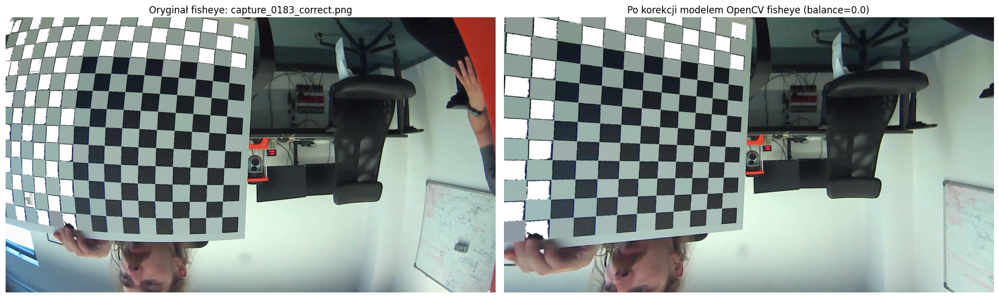

In [8]:
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml
from IPython.display import display

# Kalibracja modelem fisheye OpenCV (4 współczynniki: k1, k2, k3, k4).
POINTS_DIR = Path("/home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/characteristic_point")
CALIBRATION_PATH = POINTS_DIR / "camera_calibration_fisheye_opencv.yaml"

object_points_all: list[np.ndarray] = []
image_points_all: list[np.ndarray] = []
view_names: list[str] = []
image_paths_for_calibration: list[Path] = []
image_size_calibration: tuple[int, int] | None = None

point_files = sorted(
    path for path in POINTS_DIR.glob("*.yaml")
    if not path.name.startswith("camera_calibration")
)
if not point_files:
    raise FileNotFoundError(f"Brak plików YAML z punktami w: {POINTS_DIR}")

for point_file in point_files:
    with point_file.open("r", encoding="utf-8") as file:
        point_data = yaml.safe_load(file)

    required_keys = {"image_points_px", "object_points_mm", "image_width_px", "image_height_px"}
    missing_keys = required_keys.difference(point_data)
    if missing_keys:
        raise ValueError(f"{point_file.name}: brak pól {sorted(missing_keys)}")

    # cv2.fisheye oczekuje punktów w kształcie (N, 1, 2/3).
    image_points_view = np.asarray(point_data["image_points_px"], dtype=np.float64).reshape(-1, 1, 2)
    object_points_view = np.asarray(point_data["object_points_mm"], dtype=np.float64).reshape(-1, 1, 3)
    if len(image_points_view) != len(object_points_view) or len(image_points_view) < 4:
        raise ValueError(
            f"{point_file.name}: niepoprawna liczba punktów "
            f"2D={len(image_points_view)}, 3D={len(object_points_view)}"
        )

    current_size = (int(point_data["image_width_px"]), int(point_data["image_height_px"]))
    if image_size_calibration is None:
        image_size_calibration = current_size
    elif current_size != image_size_calibration:
        raise ValueError(
            f"{point_file.name}: rozmiar {current_size} różni się od {image_size_calibration}"
        )

    object_points_all.append(object_points_view)
    image_points_all.append(image_points_view)
    view_names.append(str(point_data.get("image_name", point_file.stem)))
    image_paths_for_calibration.append(Path(point_data.get("image_path", "")))

assert image_size_calibration is not None
if len(object_points_all) < 3:
    raise ValueError("Kalibracja wymaga punktów z co najmniej 3 różnych obrazów.")

camera_matrix = np.zeros((3, 3), dtype=np.float64)
distortion_coefficients = np.zeros((4, 1), dtype=np.float64)
calibration_flags = cv2.fisheye.CALIB_RECOMPUTE_EXTRINSIC | cv2.fisheye.CALIB_FIX_SKEW
calibration_criteria = (
    cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
    100,
    1e-9,
)

rms_opencv, camera_matrix, distortion_coefficients, rotation_vectors, translation_vectors = cv2.fisheye.calibrate(
    object_points_all,
    image_points_all,
    image_size_calibration,
    camera_matrix,
    distortion_coefficients,
    flags=calibration_flags,
    criteria=calibration_criteria,
)

# Niezależne obliczenie błędu reprojekcji dla każdego obrazu.
per_view_rows = []
total_squared_error = 0.0
total_point_count = 0
for name, object_view, image_view, rotation, translation in zip(
    view_names,
    object_points_all,
    image_points_all,
    rotation_vectors,
    translation_vectors,
):
    projected_points, _ = cv2.fisheye.projectPoints(
        object_view, rotation, translation, camera_matrix, distortion_coefficients
    )
    residuals = image_view.reshape(-1, 2) - projected_points.reshape(-1, 2)
    squared_error = float(np.sum(residuals**2))
    point_count = len(image_view)
    view_rmse = float(np.sqrt(squared_error / point_count))
    total_squared_error += squared_error
    total_point_count += point_count
    per_view_rows.append({"obraz": name, "liczba_punktów": point_count, "RMSE_reprojekcji_px": view_rmse})

global_reprojection_rmse = float(np.sqrt(total_squared_error / total_point_count))
per_view_errors = pd.DataFrame(per_view_rows)

calibration_payload = {
    "calibration_method": "cv2.fisheye.calibrate",
    "camera_model": "OpenCV fisheye",
    "image_width_px": image_size_calibration[0],
    "image_height_px": image_size_calibration[1],
    "view_count": len(view_names),
    "point_count_total": total_point_count,
    "opencv_rms_px": float(rms_opencv),
    "global_reprojection_rmse_px": global_reprojection_rmse,
    "camera_matrix": camera_matrix.tolist(),
    "distortion_coefficients": distortion_coefficients.reshape(-1).tolist(),
    "distortion_order": ["k1", "k2", "k3", "k4"],
    "rotation_vectors": [vector.reshape(-1).tolist() for vector in rotation_vectors],
    "translation_vectors_mm": [vector.reshape(-1).tolist() for vector in translation_vectors],
    "per_view_reprojection_rmse_px": {
        row["obraz"]: float(row["RMSE_reprojekcji_px"]) for row in per_view_rows
    },
    "source_files": [path.name for path in point_files],
}
with CALIBRATION_PATH.open("w", encoding="utf-8") as file:
    yaml.safe_dump(calibration_payload, file, sort_keys=False, allow_unicode=True)

np.set_printoptions(precision=6, suppress=True)
print(f"Użyto obrazów: {len(view_names)}")
print(f"Rozmiar obrazu: {image_size_calibration[0]} × {image_size_calibration[1]} px")
print(f"RMS zwrócony przez OpenCV fisheye: {rms_opencv:.6f} px")
print(f"Globalny RMSE reprojekcji: {global_reprojection_rmse:.6f} px")
print("\nMacierz kamery K:")
print(camera_matrix)
print("\nWspółczynniki dystorsji fisheye [k1, k2, k3, k4]:")
print(distortion_coefficients.reshape(-1))
print(f"\nWynik zapisano w: {CALIBRATION_PATH}")
display(per_view_errors.style.format({"RMSE_reprojekcji_px": "{:.6f}"}))

# Wizualna kontrola korekcji fisheye na pierwszym dostępnym obrazie.
preview_path = next((path for path in image_paths_for_calibration if path.is_file()), None)
if preview_path is not None:
    preview_bgr = cv2.imread(str(preview_path), cv2.IMREAD_COLOR)
    if preview_bgr is not None:
        rectification_matrix = np.eye(3, dtype=np.float64)
        new_camera_matrix = cv2.fisheye.estimateNewCameraMatrixForUndistortRectify(
            camera_matrix,
            distortion_coefficients,
            image_size_calibration,
            rectification_matrix,
            balance=0.0,
            new_size=image_size_calibration,
        )
        map_x, map_y = cv2.fisheye.initUndistortRectifyMap(
            camera_matrix,
            distortion_coefficients,
            rectification_matrix,
            new_camera_matrix,
            image_size_calibration,
            cv2.CV_32FC1,
        )
        undistorted_bgr = cv2.remap(
            preview_bgr, map_x, map_y, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT
        )

        figure, axes = plt.subplots(1, 2, figsize=(18, 7))
        axes[0].imshow(cv2.cvtColor(preview_bgr, cv2.COLOR_BGR2RGB))
        axes[0].set_title(f"Oryginał fisheye: {preview_path.name}")
        axes[1].imshow(cv2.cvtColor(undistorted_bgr, cv2.COLOR_BGR2RGB))
        axes[1].set_title("Po korekcji modelem OpenCV fisheye (balance=0.0)")
        for axis in axes:
            axis.axis("off")
        plt.tight_layout()
        plt.show()
else:
    print("Nie znaleziono obrazu źródłowego do wizualizacji korekcji fisheye.")

In [9]:
# Tabele parametrów: klasyczna kalibracja fisheye oraz predykcja sieci neuronowej.
import pathlib
import sys

import torch

PROJECT_ROOT = Path("/home/dbabiarczyk/studia/semestr10/camera_calibration")
CHECKPOINT_PATH = PROJECT_ROOT / "outputs/calibration_net_fisheye/best_model.pth"

# Pierwsza tabela: parametry wyznaczone przez cv2.fisheye.calibrate.
parameter_names = ["fx", "fy", "cx", "cy", "k1", "k2", "k3", "k4"]
opencv_values = np.array([
    camera_matrix[0, 0],
    camera_matrix[1, 1],
    camera_matrix[0, 2],
    camera_matrix[1, 2],
    *distortion_coefficients.reshape(-1),
], dtype=np.float64)
parameter_units = ["px", "px", "px", "px", "-", "-", "-", "-"]

opencv_parameter_table = pd.DataFrame({
    "parametr": parameter_names + ["RMSE reprojekcji"],
    "wartość": [*opencv_values, global_reprojection_rmse],
    "jednostka": parameter_units + ["px"],
})
print("Tabela 1. Klasyczna kalibracja OpenCV fisheye")
display(opencv_parameter_table.style.format({"wartość": "{:.8f}"}))

# Odtworzenie architektury i konfiguracji zapisanej w checkpoincie.
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))
# Kompatybilność checkpointów zapisanych w innej wersji Pythona.
sys.modules.setdefault("pathlib._local", pathlib)
from src.networks_tool.models import FisheyeCornerGRUSequenceCalibrationNet

checkpoint = torch.load(CHECKPOINT_PATH, map_location="cpu", weights_only=False)
network_config = checkpoint["config"]
network_model = FisheyeCornerGRUSequenceCalibrationNet(
    num_outputs=network_config.num_outputs,
    num_points=(network_config.fisheye_board_squares_x - 1)
    * (network_config.fisheye_board_squares_y - 1),
)
network_model.load_state_dict(checkpoint["model_state_dict"])
network_model.eval()

if image_size_calibration != (
    network_config.fisheye_image_width,
    network_config.fisheye_image_height,
):
    raise ValueError(
        "Rozdzielczość danych nie jest zgodna z rozdzielczością treningową sieci: "
        f"{image_size_calibration} != "
        f"{(network_config.fisheye_image_width, network_config.fisheye_image_height)}"
    )
if len(image_points_all) != network_config.sequence_length:
    raise ValueError(
        f"Sieć wymaga {network_config.sequence_length} klatek, a wczytano {len(image_points_all)}."
    )

# Preprocessing identyczny jak podczas treningu: [x, y, x_stand., y_stand.].
sequence_features = []
for image_points_view in image_points_all:
    pixel_points = image_points_view.reshape(-1, 2).astype(np.float32)
    centered_points = pixel_points - pixel_points.mean(axis=0, keepdims=True)
    coordinate_scale = np.maximum(centered_points.std(axis=0, keepdims=True), 1e-6)
    sequence_features.append(
        np.concatenate([pixel_points, centered_points / coordinate_scale], axis=1)
    )
network_input = torch.from_numpy(np.stack(sequence_features)[None]).to(torch.float32)

with torch.no_grad():
    normalized_prediction = network_model(network_input).cpu().numpy()[0].astype(np.float64)

image_width, image_height = image_size_calibration
network_values = normalized_prediction.copy()
network_values[0] *= image_width
network_values[1] *= image_height
network_values[2] *= image_width
network_values[3] *= image_height

network_camera_matrix = np.array([
    [network_values[0], 0.0, network_values[2]],
    [0.0, network_values[1], network_values[3]],
    [0.0, 0.0, 1.0],
], dtype=np.float64)
network_distortion = network_values[4:].reshape(4, 1)

# Błąd reprojekcji AI: dla każdej klatki estymowana jest tylko poza planszy,
# natomiast K i D pozostają wartościami przewidzianymi przez sieć.
network_squared_error = 0.0
network_point_count = 0
network_per_view_rows = []
identity_camera = np.eye(3, dtype=np.float64)
zero_distortion = np.zeros((4, 1), dtype=np.float64)
for name, object_view, image_view in zip(view_names, object_points_all, image_points_all):
    normalized_points = cv2.fisheye.undistortPoints(
        image_view, network_camera_matrix, network_distortion
    )
    pose_found, rotation, translation = cv2.solvePnP(
        object_view.reshape(-1, 3),
        normalized_points.reshape(-1, 2),
        identity_camera,
        None,
        flags=cv2.SOLVEPNP_ITERATIVE,
    )
    if not pose_found:
        raise RuntimeError(f"Nie udało się wyznaczyć pozy planszy dla {name}.")
    network_projected, _ = cv2.fisheye.projectPoints(
        object_view, rotation, translation, network_camera_matrix, network_distortion
    )
    residuals = image_view.reshape(-1, 2) - network_projected.reshape(-1, 2)
    squared_error = float(np.sum(residuals**2))
    view_point_count = len(image_view)
    view_rmse = float(np.sqrt(squared_error / view_point_count))
    network_squared_error += squared_error
    network_point_count += view_point_count
    network_per_view_rows.append({"obraz": name, "RMSE_AI_px": view_rmse})

network_reprojection_rmse = float(
    np.sqrt(network_squared_error / network_point_count)
)
network_parameter_table = pd.DataFrame({
    "parametr": parameter_names + ["RMSE reprojekcji"],
    "wartość": [*network_values, network_reprojection_rmse],
    "jednostka": parameter_units + ["px"],
})

print(f"Checkpoint: {CHECKPOINT_PATH}")
print(f"Najlepsza epoka: {checkpoint.get('epoch', 'brak informacji')}")
print(f"Wejście sieci: {tuple(network_input.shape)}")
print("Tabela 2. Kalibracja przewidziana przez sieć neuronową")
display(network_parameter_table.style.format({"wartość": "{:.8f}"}))

# Pomocnicze zestawienie obu metod ułatwiające ocenę różnic.
comparison_table = pd.DataFrame({
    "parametr": parameter_names,
    "OpenCV_fisheye": opencv_values,
    "sieć_neuronowa": network_values,
    "różnica_AI_minus_OpenCV": network_values - opencv_values,
})
print("Porównanie parametrów")
display(comparison_table.style.format({
    "OpenCV_fisheye": "{:.8f}",
    "sieć_neuronowa": "{:.8f}",
    "różnica_AI_minus_OpenCV": "{:+.8f}",
}))

Tabela 1. Klasyczna kalibracja OpenCV fisheye


,parametr,wartość,jednostka
0,fx,1046.68755170,px
1,fy,1047.87211253,px
2,cx,958.08464933,px
3,cy,500.37109627,px
4,k1,-0.06284632,-
5,k2,0.00333982,-
6,k3,-0.01334484,-
7,k4,0.00472563,-
8,RMSE reprojekcji,0.42319546,px


Checkpoint: /home/dbabiarczyk/studia/semestr10/camera_calibration/outputs/calibration_net_fisheye/best_model.pth
Najlepsza epoka: 28
Wejście sieci: (1, 10, 81, 4)
Tabela 2. Kalibracja przewidziana przez sieć neuronową


,parametr,wartość,jednostka
0,fx,1050.53649902,px
1,fy,1130.82996368,px
2,cx,953.35121155,px
3,cy,490.28056741,px
4,k1,-0.00459871,-
5,k2,0.02836601,-
6,k3,-0.00109115,-
7,k4,0.01751303,-
8,RMSE reprojekcji,6.63121473,px


Porównanie parametrów


,parametr,OpenCV_fisheye,sieć_neuronowa,różnica_AI_minus_OpenCV
0,fx,1046.68755170,1050.53649902,+3.84894732
1,fy,1047.87211253,1130.82996368,+82.95785116
2,cx,958.08464933,953.35121155,-4.73343778
3,cy,500.37109627,490.28056741,-10.09052887
4,k1,-0.06284632,-0.00459871,+0.05824761
5,k2,0.00333982,0.02836601,+0.02502619
6,k3,-0.01334484,-0.00109115,+0.01225369
7,k4,0.00472563,0.01751303,+0.01278740


In [ ]:
# Wizualizacja wszystkich zdjęć po korekcji z użyciem parametrów zwróconych przez sieć.
NETWORK_UNDISTORTED_DIR = POINTS_DIR / "undistorted_network"
NETWORK_UNDISTORTED_DIR.mkdir(parents=True, exist_ok=True)

network_rectification = np.eye(3, dtype=np.float64)
network_new_camera_matrix = cv2.fisheye.estimateNewCameraMatrixForUndistortRectify(
    network_camera_matrix,
    network_distortion,
    image_size_calibration,
    network_rectification,
    balance=0.0,
    new_size=image_size_calibration,
)
network_map_x, network_map_y = cv2.fisheye.initUndistortRectifyMap(
    network_camera_matrix,
    network_distortion,
    network_rectification,
    network_new_camera_matrix,
    image_size_calibration,
    cv2.CV_32FC1,
)

visualization_rows = []
for source_path in image_paths_for_calibration:
    source_bgr = cv2.imread(str(source_path), cv2.IMREAD_COLOR)
    if source_bgr is None:
        print(f"Pominięto obraz, którego nie można odczytać: {source_path}")
        continue
    if (source_bgr.shape[1], source_bgr.shape[0]) != image_size_calibration:
        print(f"Pominięto obraz o niezgodnym rozmiarze: {source_path.name}")
        continue

    corrected_bgr = cv2.remap(
        source_bgr,
        network_map_x,
        network_map_y,
        interpolation=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
    )
    corrected_path = NETWORK_UNDISTORTED_DIR / f"{source_path.stem}_network_undistorted.png"
    if not cv2.imwrite(str(corrected_path), corrected_bgr):
        raise OSError(f"Nie udało się zapisać obrazu: {corrected_path}")
    visualization_rows.append((source_path.name, source_bgr, corrected_bgr))

if not visualization_rows:
    raise RuntimeError("Nie znaleziono zdjęć do wizualizacji korekcji sieci neuronowej.")

# Dwa zestawy oryginał–korekcja w każdym wierszu, aby pokazać wszystkie zdjęcia.
figure_rows = (len(visualization_rows) + 1) // 2
figure, axes = plt.subplots(figure_rows, 4, figsize=(24, 5.5 * figure_rows), squeeze=False)
for axis in axes.ravel():
    axis.axis("off")

for image_index, (image_name, source_bgr, corrected_bgr) in enumerate(visualization_rows):
    row = image_index // 2
    column = (image_index % 2) * 2
    axes[row, column].imshow(cv2.cvtColor(source_bgr, cv2.COLOR_BGR2RGB))
    axes[row, column].set_title(f"Oryginał: {image_name}", fontsize=12)
    axes[row, column + 1].imshow(cv2.cvtColor(corrected_bgr, cv2.COLOR_BGR2RGB))
    axes[row, column + 1].set_title("Po korekcji parametrami sieci", fontsize=12)
    axes[row, column].axis("off")
    axes[row, column + 1].axis("off")

figure.suptitle(
    "Korekcja fisheye z użyciem parametrów przewidzianych przez sieć neuronową "
    f"(balance=0.0, RMSE={network_reprojection_rmse:.4f} px)",
    fontsize=16,
)
plt.tight_layout(rect=(0, 0, 1, 0.98))
plt.show()

print(f"Wyświetlono i zapisano {len(visualization_rows)} obrazów po korekcji.")
print(f"Katalog wynikowy: {NETWORK_UNDISTORTED_DIR}")
print("Macierz K użyta do korekcji:")
print(network_camera_matrix)
print("Współczynniki D [k1, k2, k3, k4] użyte do korekcji:")
print(network_distortion.reshape(-1))

# Porównanie czterech metod kalibracji fisheyeSekcja pokazuje trzy przykładowe zdjęcia przed i po korekcji oraz tabele różnic parametrów względem OpenCV.

In [ ]:
%run /home/dbabiarczyk/studia/semestr10/camera_calibration/data/xfronter_calibration/dataset_correct_chessboard/compare_fisheye_calibrations.py